# Credit Card Customer Segmentation

## Import Libraries

In [1]:
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN, AgglomerativeClustering

from sklearn.impute import KNNImputer
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn import metrics

In [2]:
df = pd.read_csv('CreditCard_data.csv')
df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


# Data Cleaning

In [3]:
df.isna().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [5]:
dtypes = pd.DataFrame(df.dtypes, columns=["Data Type"])
dtypes["Unique Values"] = df.nunique()
dtypes["Null Values"] = df.isnull().sum()
dtypes['% null Values'] = df.isnull().sum()/len(df)
dtypes.sort_values(by="Null Values", ascending=False).style.background_gradient(cmap='RdYlBu', axis=0)

,Data Type,Unique Values,Null Values,% null Values
MINIMUM_PAYMENTS,float64,8636,313,0.034972
CREDIT_LIMIT,float64,205,1,0.000112
CUST_ID,object,8950,0,0.000000
BALANCE,float64,8871,0,0.000000
PRC_FULL_PAYMENT,float64,47,0,0.000000
PAYMENTS,float64,8711,0,0.000000
PURCHASES_TRX,int64,173,0,0.000000
CASH_ADVANCE_TRX,int64,65,0,0.000000
CASH_ADVANCE_FREQUENCY,float64,54,0,0.000000
PURCHASES_INSTALLMENTS_FREQUENCY,float64,47,0,0.000000


In [6]:
df.drop(columns='CUST_ID', inplace=True)

In [7]:
df.dropna(subset=['CREDIT_LIMIT'], inplace=True)

In [8]:
df['MINIMUM_PAYMENTS'].fillna(df['MINIMUM_PAYMENTS'].median(), inplace=True)
df

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,312.452292,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,312.452292,0.000000,6
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [9]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000
mean,1564.647593,0.877350,1003.316936,592.503572,411.113579,978.959616,0.490405,0.202480,0.364478,0.135141,3.249078,14.711476,4494.449450,1733.336511,845.003358,0.153732,11.517935
std,2081.584016,0.236798,2136.727848,1659.968851,904.378205,2097.264344,0.401360,0.298345,0.397451,0.200132,6.824987,24.858552,3638.815725,2895.168146,2332.905284,0.292511,1.337134
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.365782,0.888889,39.800000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.282850,170.875613,0.000000,12.000000
50%,873.680279,1.000000,361.490000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,857.062706,312.452292,0.000000,12.000000
75%,2054.372848,1.000000,1110.170000,577.830000,468.650000,1113.868654,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.279320,788.721609,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


# EDA

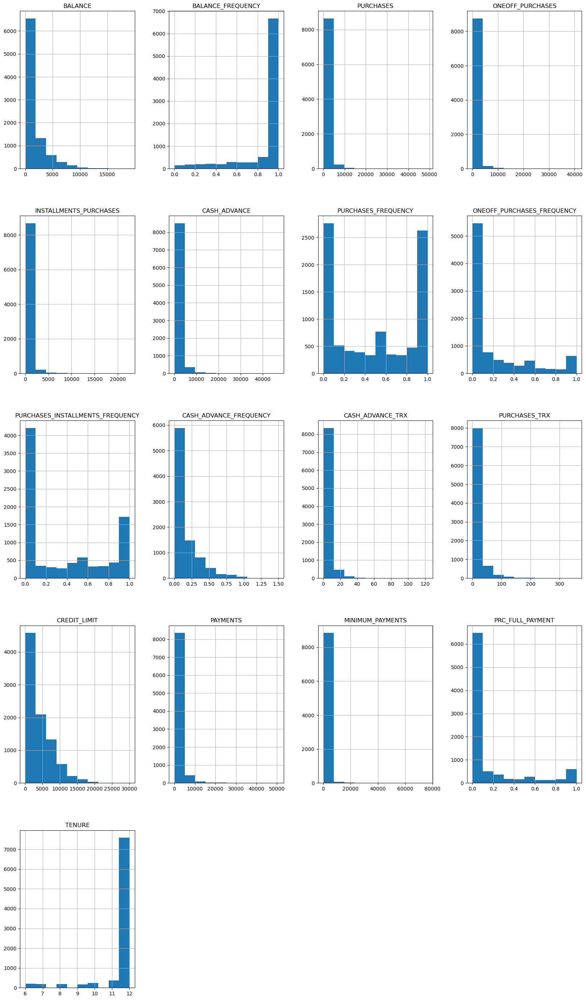

In [10]:
df_visual_hist = df.hist(figsize=(20,35))

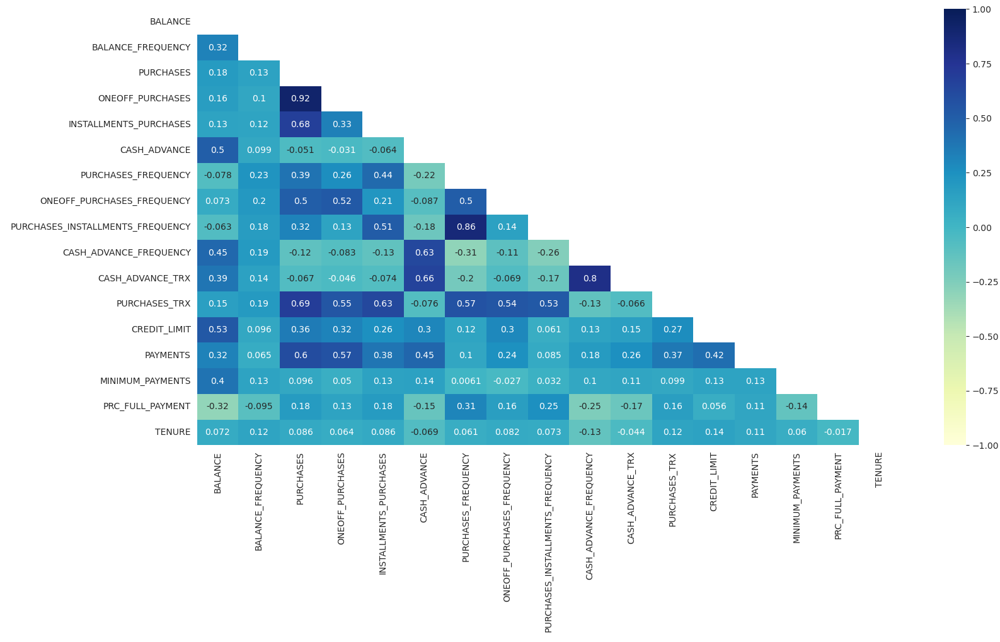

In [12]:
corr = df.corr()
mask = np.zeros_like(corr)

mask[np.triu_indices_from(mask)] = True

with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(18, 9))
    ax = sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, annot=True, cmap="YlGnBu")

# Data Preprocessing and Scaling

In [13]:
Skewed_Cols = (df.skew().sort_values(ascending=False)).to_frame("skewness_value")
Skewed_Cols

,skewness_value
MINIMUM_PAYMENTS,13.851864
ONEOFF_PURCHASES,10.044622
PURCHASES,8.143969
INSTALLMENTS_PURCHASES,7.298823
PAYMENTS,5.907465
CASH_ADVANCE_TRX,5.720976
CASH_ADVANCE,5.166323
PURCHASES_TRX,4.630493
BALANCE,2.393270
PRC_FULL_PAYMENT,1.942641


In [15]:
Skewed_Cols = (df.skew().sort_values(ascending=False)).to_frame("skewness_value")
Skewed_Cols = Skewed_Cols.query('skewness_value > 0.75')
Skewed_Cols

,skewness_value
MINIMUM_PAYMENTS,13.851864
ONEOFF_PURCHASES,10.044622
PURCHASES,8.143969
INSTALLMENTS_PURCHASES,7.298823
PAYMENTS,5.907465
CASH_ADVANCE_TRX,5.720976
CASH_ADVANCE,5.166323
PURCHASES_TRX,4.630493
BALANCE,2.393270
PRC_FULL_PAYMENT,1.942641


In [16]:
log_columns = df.skew().sort_values(ascending=False)
log_columns = log_columns.loc[log_columns > 0.75]
log_columns

MINIMUM_PAYMENTS              13.851864
ONEOFF_PURCHASES              10.044622
PURCHASES                      8.143969
INSTALLMENTS_PURCHASES         7.298823
PAYMENTS                       5.907465
CASH_ADVANCE_TRX               5.720976
CASH_ADVANCE                   5.166323
PURCHASES_TRX                  4.630493
BALANCE                        2.393270
PRC_FULL_PAYMENT               1.942641
CASH_ADVANCE_FREQUENCY         1.828644
ONEOFF_PURCHASES_FREQUENCY     1.535453
CREDIT_LIMIT                   1.522464
dtype: float64

In [17]:
for col in log_columns.index:
    df[col] = np.log1p(df[col])

In [18]:
df.dtypes

BALANCE                             float64
BALANCE_FREQUENCY                   float64
PURCHASES                           float64
ONEOFF_PURCHASES                    float64
INSTALLMENTS_PURCHASES              float64
CASH_ADVANCE                        float64
PURCHASES_FREQUENCY                 float64
ONEOFF_PURCHASES_FREQUENCY          float64
PURCHASES_INSTALLMENTS_FREQUENCY    float64
CASH_ADVANCE_FREQUENCY              float64
CASH_ADVANCE_TRX                    float64
PURCHASES_TRX                       float64
CREDIT_LIMIT                        float64
PAYMENTS                            float64
MINIMUM_PAYMENTS                    float64
PRC_FULL_PAYMENT                    float64
TENURE                                int64
dtype: object

In [19]:
float_columns = [x for x in df.columns if x not in ['TENURE']]

corr_mat = df[float_columns].corr()

for x in range(len(float_columns)):
    corr_mat.iloc[x,x] = 0.0
    
corr_mat

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT
BALANCE,0.000000,0.652479,-0.075298,0.180294,-0.111140,0.521825,-0.094183,0.155393,-0.107259,0.471487,0.504196,-0.017427,0.299845,0.428830,0.762650,-0.423093
BALANCE_FREQUENCY,0.652479,0.000000,0.096494,0.140200,0.112387,0.164776,0.229440,0.202549,0.175869,0.197591,0.193710,0.200618,0.095072,0.321647,0.418795,-0.096746
PURCHASES,-0.075298,0.096494,0.000000,0.683469,0.685340,-0.496541,0.781709,0.574809,0.592360,-0.377206,-0.416757,0.888964,0.187703,0.206387,-0.051442,0.255453
ONEOFF_PURCHASES,0.180294,0.140200,0.683469,0.000000,0.161334,-0.190100,0.373551,0.813927,0.092689,-0.128766,-0.144825,0.574333,0.284856,0.266852,0.058759,0.041726
INSTALLMENTS_PURCHASES,-0.111140,0.112387,0.685340,0.161334,0.000000,-0.394285,0.794754,0.191309,0.878660,-0.310140,-0.335658,0.782650,0.106571,0.165181,-0.038714,0.281505
CASH_ADVANCE,0.521825,0.164776,-0.496541,-0.190100,-0.394285,0.000000,-0.432580,-0.184670,-0.356461,0.814491,0.898421,-0.430743,0.119436,0.182760,0.407652,-0.325714
PURCHASES_FREQUENCY,-0.094183,0.229440,0.781709,0.373551,0.794754,-0.432580,0.000000,0.500061,0.862921,-0.332591,-0.367199,0.909009,0.112639,0.175713,-0.053020,0.312615
ONEOFF_PURCHASES_FREQUENCY,0.155393,0.202549,0.574809,0.813927,0.191309,-0.184670,0.500061,0.000000,0.140095,-0.123237,-0.146006,0.621670,0.289817,0.273988,0.040354,0.142166
PURCHASES_INSTALLMENTS_FREQUENCY,-0.107259,0.175869,0.592360,0.092689,0.878660,-0.356461,0.862921,0.140095,0.000000,-0.282210,-0.305482,0.759508,0.052561,0.132467,-0.032487,0.257371
CASH_ADVANCE_FREQUENCY,0.471487,0.197591,-0.377206,-0.128766,-0.310140,0.814491,-0.332591,-0.123237,-0.282210,0.000000,0.936477,-0.327399,0.132118,0.193601,0.373961,-0.269960


In [20]:
sc = StandardScaler()
df[float_columns] = sc.fit_transform(df[float_columns])

df.head(4)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-1.205498,-0.249881,-0.113732,-0.987198,0.394362,-0.930636,-0.806649,-0.732543,-0.707409,-0.724294,-0.810038,-0.579693,-1.447095,-0.825080,-0.830453,-0.556409,12
1,0.948821,0.134049,-1.680213,-0.987198,-1.087586,1.528788,-1.221928,-0.732543,-0.917090,0.699585,0.784546,-1.379434,0.925997,1.065109,0.908196,0.391881,12
2,0.824885,0.517980,0.600600,1.061910,-1.087586,-0.930636,1.269742,2.466616,-0.917090,-0.724294,-0.810038,0.487735,1.010161,-0.119646,0.450254,-0.556409,12
3,0.624529,-1.017743,0.827395,1.265665,-1.087586,0.564410,-1.014290,-0.363114,-0.917090,-0.213543,-0.123288,-0.874853,1.010161,-4.163779,-0.144341,-0.556409,12


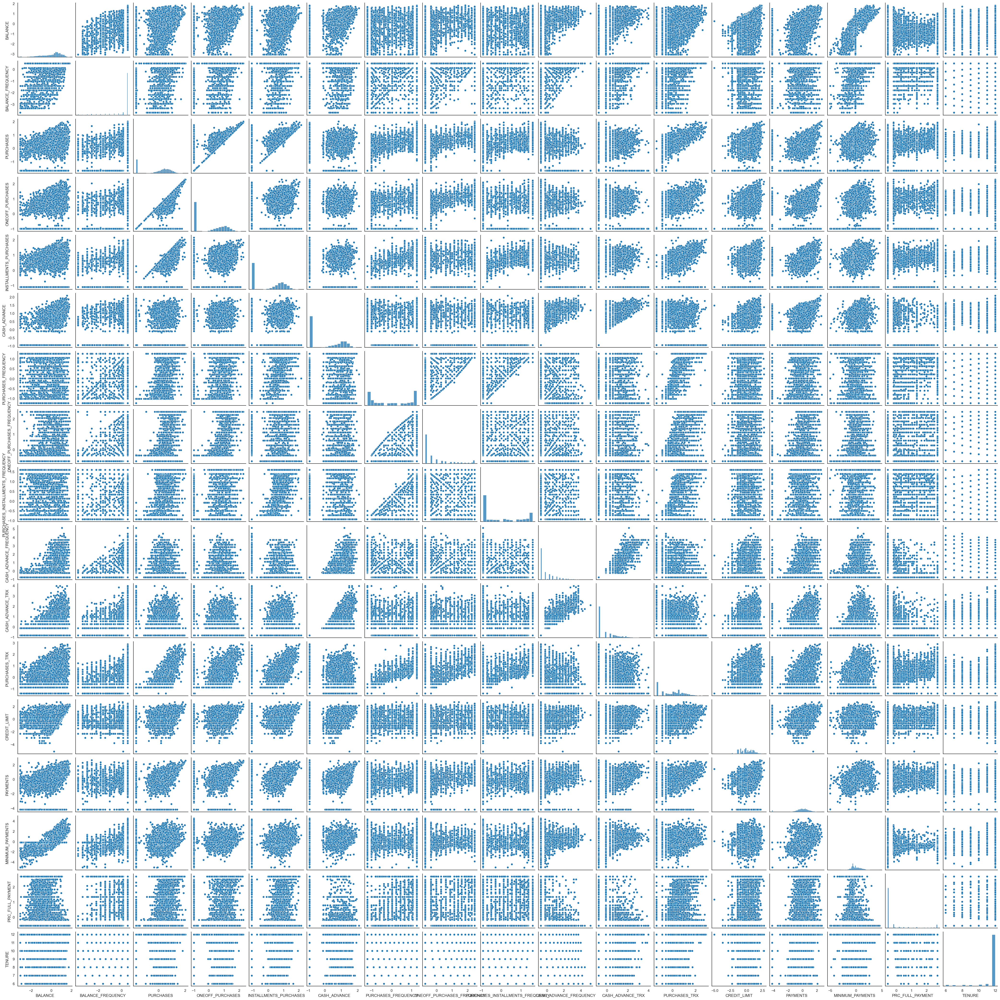

In [21]:
sns.set_context('notebook')
sns.set_style('white')
sns.pairplot(df)

# Dimensionality Reduction using PCA

In [22]:
pca = PCA()
pca.fit_transform(df)

array([[-0.2865574 , -2.62004036, -0.92666873, ..., -0.04687599,
        -0.01251306,  0.08908321],
       [-3.39663879,  1.13076296, -0.89855864, ..., -0.02292583,
        -0.18381821, -0.04878626],
       [ 1.54870236,  1.31535771, -0.90795318, ..., -0.50354548,
         0.12429916, -0.25483353],
       ...,
       [ 0.70793978, -3.79233844,  5.14427856, ..., -0.10363789,
         0.1623575 , -0.07241602],
       [-3.05053415, -4.34249586,  4.69484077, ...,  0.34689358,
         0.15546637,  0.05807234],
       [-0.42380186, -1.17916097,  5.46589147, ...,  0.42144813,
        -0.35292253, -0.08815721]])

In [25]:
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(df), index=df.index, columns = df.columns)
X.head()

pca = PCA()
X_PCA = pd.DataFrame(pca.fit_transform(X), index=X.index, columns=[f'Component {i}' for i in range(pca.n_components_)])
X_PCA.head()

,Component 0,Component 1,Component 2,Component 3,Component 4,Component 5,Component 6,Component 7,Component 8,Component 9,Component 10,Component 11,Component 12,Component 13,Component 14,Component 15,Component 16
0,-0.290557,-2.701420,-0.287403,-1.074426,0.345742,-0.091789,-0.693707,-0.300528,0.276315,-0.424686,0.231471,0.659833,0.630377,-0.401832,-0.046690,-0.012796,0.089051
1,-3.443099,1.017325,-0.061638,-0.135576,-1.763812,-0.465616,0.692435,-0.063263,-0.258252,0.455603,-0.401590,-0.122536,-0.063987,0.007661,-0.021876,-0.184007,-0.048875
2,1.514807,1.298223,2.644942,-0.970480,0.755350,-0.167064,0.443040,0.804067,0.078739,1.180295,0.613787,-0.237542,0.465719,0.613766,-0.504617,0.121052,-0.255017
3,-1.267655,-1.138053,1.874622,-0.501551,1.581657,2.352378,0.293975,2.435000,-0.847772,-1.561221,-1.294527,-0.349395,-0.323135,0.866851,-0.494292,-0.164842,0.243516
4,-1.133416,-1.335866,0.869815,-1.720601,0.383102,-1.215185,-0.302786,-0.369439,0.322452,-0.157493,0.179196,0.132780,-0.249933,0.187372,0.069592,0.042238,0.040223


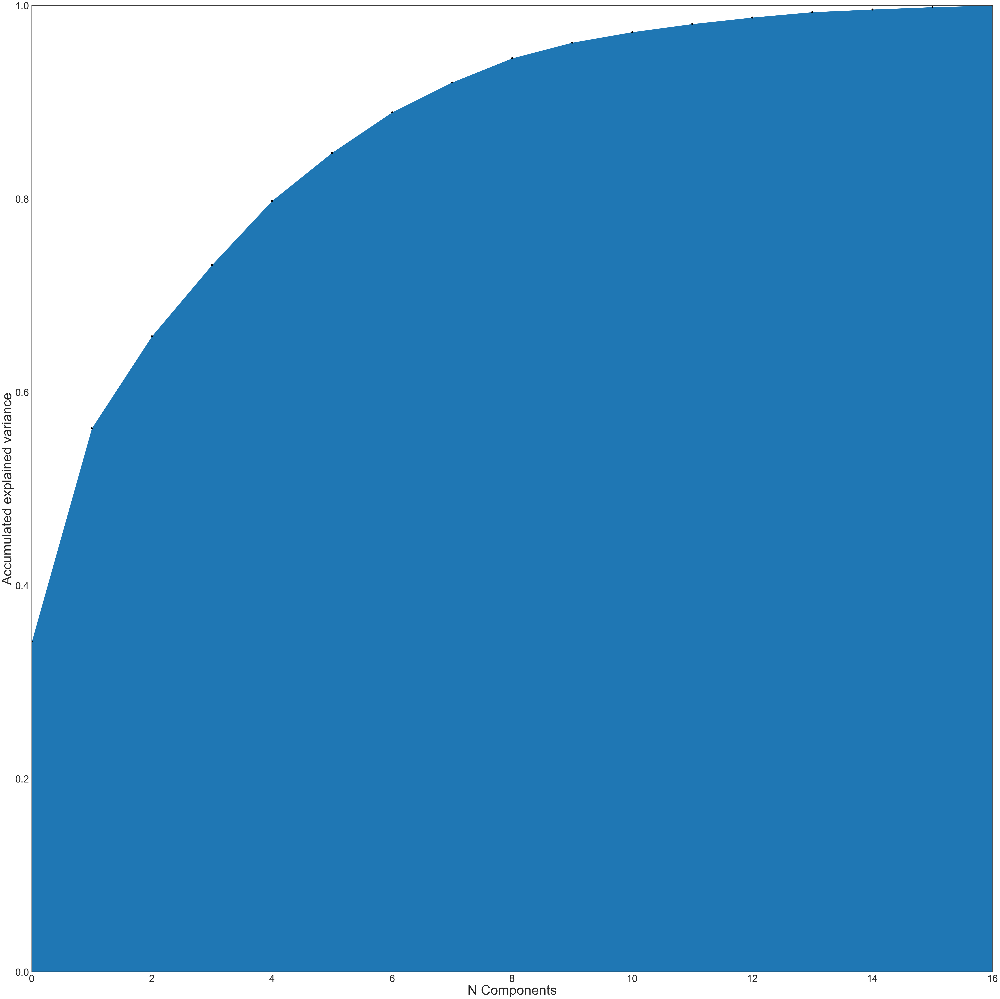

In [29]:
from itertools import accumulate
def plot_explained_variance(pca):
    acc = [*accumulate(pca.explained_variance_ratio_)]
    fig, ax = plt.subplots(1, figsize=(50,50))
    ax.stackplot(range(pca.n_components_), acc)
    ax.scatter(range(pca.n_components_), acc, color='black')
    ax.set_ylim(0,1)
    ax.set_xlim(0, pca.n_components_-1)
    ax.tick_params(axis='both', labelsize=36)
    ax.set_xlabel('N Components', fontsize=48)
    ax.set_ylabel('Accumulated explained variance', fontsize=48)
    plt.tight_layout()
    plt.show()
plot_explained_variance(pca)

In [32]:
threshold = 0.99
num = next(i for i, x in enumerate(accumulate(pca.explained_variance_ratio_), 1) if x >= threshold)
print(f'We can keep the first {num} components and discard the other {pca.n_components_-num},')
print(f'keeping >={100 * threshold}% of the explained variance!')

We can keep the first 14 components and discard the other 3,
keeping >=99.0% of the explained variance!


In [33]:
X_PCA.drop([f'Component {i}' for i in range(num, pca.n_components_)], axis=1, inplace=True)
X_PCA.head()

,Component 0,Component 1,Component 2,Component 3,Component 4,Component 5,Component 6,Component 7,Component 8,Component 9,Component 10,Component 11,Component 12,Component 13
0,-0.290557,-2.701420,-0.287403,-1.074426,0.345742,-0.091789,-0.693707,-0.300528,0.276315,-0.424686,0.231471,0.659833,0.630377,-0.401832
1,-3.443099,1.017325,-0.061638,-0.135576,-1.763812,-0.465616,0.692435,-0.063263,-0.258252,0.455603,-0.401590,-0.122536,-0.063987,0.007661
2,1.514807,1.298223,2.644942,-0.970480,0.755350,-0.167064,0.443040,0.804067,0.078739,1.180295,0.613787,-0.237542,0.465719,0.613766
3,-1.267655,-1.138053,1.874622,-0.501551,1.581657,2.352378,0.293975,2.435000,-0.847772,-1.561221,-1.294527,-0.349395,-0.323135,0.866851
4,-1.133416,-1.335866,0.869815,-1.720601,0.383102,-1.215185,-0.302786,-0.369439,0.322452,-0.157493,0.179196,0.132780,-0.249933,0.187372


In [34]:
pca = PCA(n_components = 13)
X_pca = pca.fit_transform(df)

In [35]:
component_names = [f"PC{i+1}" for i in range (X_pca.shape[1])]

X_pca = pd.DataFrame(X_pca, columns=component_names)
X_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13
0,-0.286557,-2.620040,-0.926669,-0.580910,-0.886799,0.106744,0.582584,-0.369828,0.279232,-0.423496,0.233957,0.658728,0.633027
1,-3.396639,1.130763,-0.898559,-0.357396,1.148741,-1.090324,-0.751462,-0.034879,-0.259381,0.455426,-0.401722,-0.122651,-0.063944
2,1.548702,1.315358,-0.907953,2.448419,-1.285326,-0.277900,-0.283274,0.838431,0.080339,1.180357,0.612776,-0.236726,0.462486
3,-1.252787,-1.067921,-0.776912,1.756958,-1.370869,2.426887,-0.819751,2.450619,-0.838837,-1.560325,-1.293612,-0.349513,-0.325574
4,-1.112765,-1.241485,-1.324798,0.466366,-1.461050,-1.150616,0.611727,-0.394448,0.322433,-0.157289,0.179353,0.132953,-0.250357


# KMeans Algorithm

In [38]:
km = KMeans(n_clusters=7, init='k-means++', random_state=42)
km = km.fit(df[float_columns])

y = km.predict(df[float_columns])

C:\Users\sonak\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [39]:
km_list = list()

for clust in range(1,21):
    km = KMeans(n_clusters=clust, random_state=42)
    km = km.fit(df[float_columns])
    
    km_list.append(pd.Series({'clusters': clust, 'inertia': km.inertia_, 'model': km}))

C:\Users\sonak\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\sonak\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\sonak\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\sonak\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\sonak\anaconda3\lib\site-packages\sklearn\clust

[Text(0.5, 0, 'Cluster'), Text(0, 0.5, 'Inertia')]

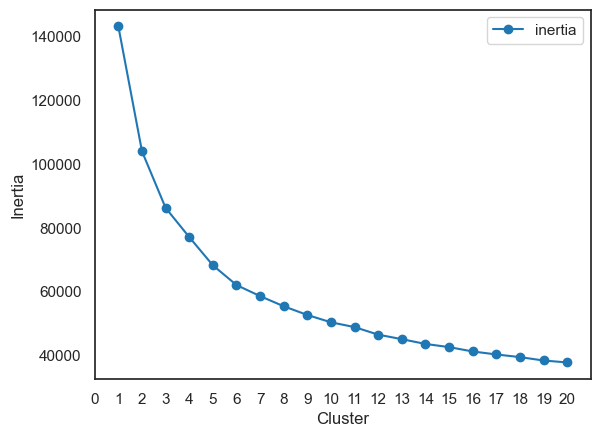

In [42]:
plot_data = (pd.concat(km_list, axis=1).T[['clusters', 'inertia']].set_index('clusters'))
ax = plot_data.plot(marker = 'o', ls = '-')
ax.set_xticks(range(0,21,1))
ax.set_xlim(0,21)
ax.set(xlabel='Cluster', ylabel= 'Inertia')

In [72]:
km.labels = km.fit_predict(df[float_columns])
df['kmeans'] = km.labels_

C:\Users\sonak\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


# PCA KMeans

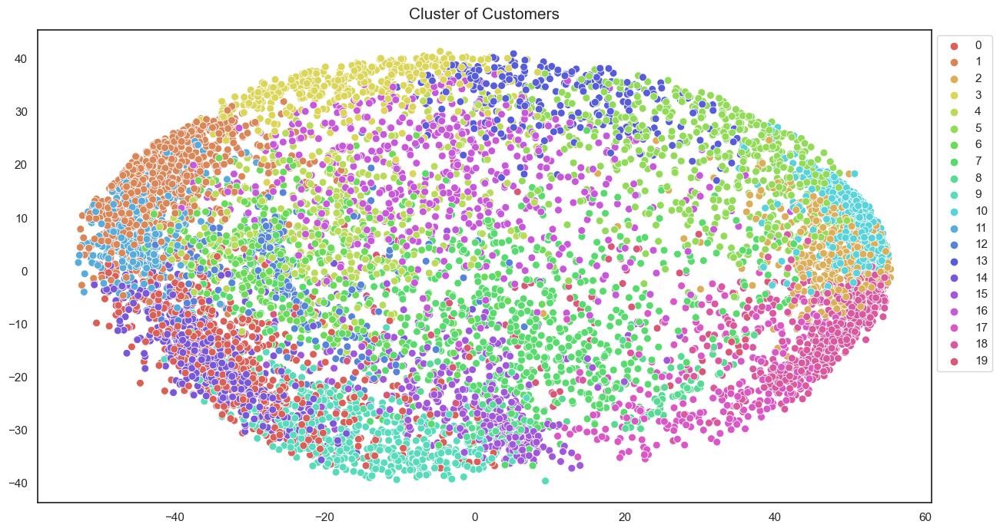

In [56]:
from sklearn.metrics.pairwise import cosine_similarity

dist = 1 - cosine_similarity(df[float_columns])

pca = PCA(n_components=2)
X_PCA = pca.fit_transform(dist)


plt.figure(figsize=(15, 8))
sns.scatterplot(x=X_PCA[:, 0], y=X_PCA[:, 1], hue=df['kmeans'], palette=sns.color_palette('hls', km.cluster_centers_.shape[0]), s=50)
plt.title('Cluster of Customers', size=15, pad=10)
plt.legend(loc=0, bbox_to_anchor=[1, 1])
plt.show()

# Agglomerative Hierarchical Algorithm

In [57]:
ag = AgglomerativeClustering(n_clusters=7, linkage='ward', compute_full_tree=True)
ag = ag.fit(df[float_columns])
df['agglom'] = ag.fit_predict(df[float_columns])

In [62]:
from scipy.cluster.hierarchy import dendrogram, linkage
linkage_matrix = linkage(df[float_columns], method='ward')

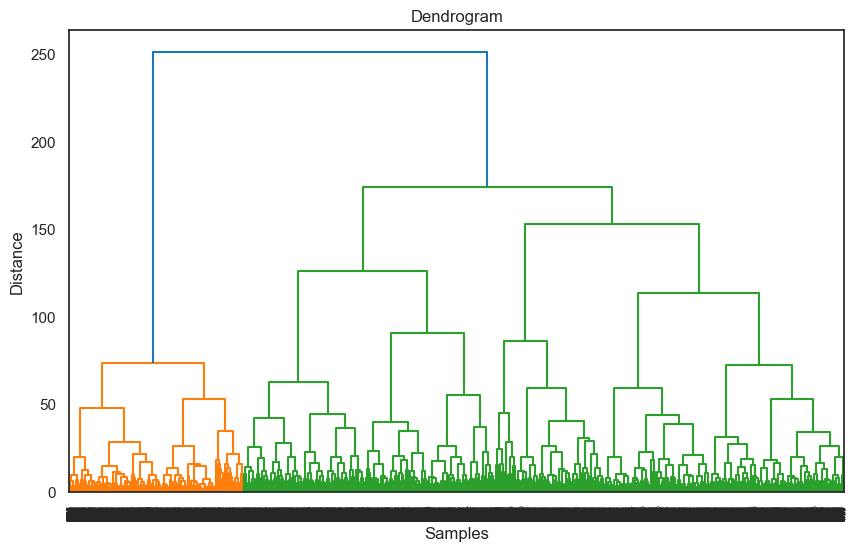

In [59]:
plt.figure(figsize=(10,6))
dendrogram(linkage_matrix)
plt.title('Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.show()

hierarchical = AgglomerativeClustering(n_clusters=3)

hierarchical.fit(df[float_columns])
hierarchical_labels = hierarchical.labels_

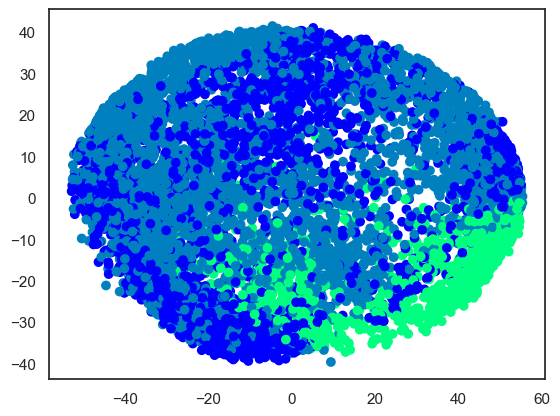

In [65]:
dist = 1 - cosine_similarity(df[float_columns])

pca = PCA(n_components=2)
X_PCA = pca.fit_transform(dist)

plt.scatter(X_PCA[:, 0], X_PCA[:, 1], c=AgglomerativeClustering(n_clusters=3).fit_predict(df), cmap=plt.cm.winter)
plt.show()

# DBSCAN

In [67]:
dbs = DBSCAN(eps=0.5, min_samples=11, metric ='euclidean')
dbs = dbs.fit(df[float_columns])

In [69]:
dbscan_labels = dbs.fit_predict(df[float_columns])
df['dbscan'] = dbscan_labels

# Compare Models

In [71]:
from sklearn.metrics import silhouette_score
dbscan_silhouette = silhouette_score(df[float_columns], dbscan_labels)
kmeans_silhouette = silhouette_score(df[float_columns], kmeans_labels)
hierarchical_silhouette = silhouette_score(df[float_columns], hierarchical_labels)

In [73]:
print("Silhoutte Score:")
print("K-means Silhoutte Score:", kmeans_silhouette)
print("DBSCAN Silhoutte Score:", dbscan_silhouette)
print("Hierarchical Silhoutte Score:", hierarchical_silhouette)

Silhoutte Score:
K-means Silhoutte Score: 0.18731850642061654
DBSCAN Silhoutte Score: -0.24781665582874784
Hierarchical Silhoutte Score: 0.1838801569707745
